In [56]:
from pathlib import Path
import pandas as pd
import numpy as np
import datetime as dt
import statsmodels.api as sm
import matplotlib.pyplot as plt

In [57]:
p = Path("C:/Users/k/Desktop/GitHub/GPS_transport/")

aug_data = pd.read_hdf(p / "processed_data" / "aug_all.h5", key="aug")
segments = pd.read_csv(p / "input_data" / "python" / "segments.csv")
markers = pd.read_csv(p / "input_data" / "python" / "markers.csv")

In [58]:
aug_data = aug_data.loc[:,["segment_id" , "aug_time", "speed"]]
aug_data = aug_data.dropna(subset=["speed"])
aug_data.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25435205 entries, 0 to 533346
Data columns (total 3 columns):
 #   Column      Non-Null Count     Dtype         
---  ------      --------------     -----         
 0   segment_id  25435205 non-null  uint16        
 1   aug_time    25435205 non-null  datetime64[ns]
 2   speed       25435205 non-null  float64       
dtypes: datetime64[ns](1), float64(1), uint16(1)
memory usage: 630.7 MB


In [59]:
selected_segment_id_A = np.arange(12,19)
selected_segment_id_B = np.arange(48,67)
selected_segment_id_C = np.arange(171,191)

In [128]:

sc_a = np.zeros((5,))

sc_a[0] =segments.loc[segments["segment_id"].isin(selected_segment_id_A),"calc_length"].sum()
sc_a[1] = len(segments.loc[segments["segment_id"].isin(selected_segment_id_A),"calc_length"])
sc_a[2] = segments.loc[segments["segment_id"].isin(selected_segment_id_A),"calc_length"].max()
sc_a[3] = segments.loc[segments["segment_id"].isin(selected_segment_id_A),"calc_length"].min()
sc_a[4] = segments.loc[segments["segment_id"].isin(selected_segment_id_A),"calc_length"].mean()



sc_b = np.zeros((5,))

sc_b[0] =segments.loc[segments["segment_id"].isin(selected_segment_id_B),"calc_length"].sum()
sc_b[1] = len(segments.loc[segments["segment_id"].isin(selected_segment_id_B),"calc_length"])
sc_b[2] = segments.loc[segments["segment_id"].isin(selected_segment_id_B),"calc_length"].max()
sc_b[3] = segments.loc[segments["segment_id"].isin(selected_segment_id_B),"calc_length"].min()
sc_b[4] = segments.loc[segments["segment_id"].isin(selected_segment_id_B),"calc_length"].mean()


sc_c = np.zeros((5,))

sc_c[0] =segments.loc[segments["segment_id"].isin(selected_segment_id_C),"calc_length"].sum()
sc_c[1] = len(segments.loc[segments["segment_id"].isin(selected_segment_id_C),"calc_length"])
sc_c[2] = segments.loc[segments["segment_id"].isin(selected_segment_id_C),"calc_length"].max()
sc_c[3] = segments.loc[segments["segment_id"].isin(selected_segment_id_C),"calc_length"].min()
sc_c[4] = segments.loc[segments["segment_id"].isin(selected_segment_id_C),"calc_length"].mean()



In [129]:
segment_excel = pd.DataFrame(np.vstack((sc_a, sc_b, sc_c)), index=["sc-a","sc-b","sc-c"], columns=["total length (m)","# segments","max segment length","min segment length","average segment length"])

In [131]:
segment_excel.to_excel("segment_excel.xlsx")

In [4]:
selected_segment_id = np.arange(48,67)
print(f"selected segments are:{selected_segment_id}")
aug_data = aug_data.loc[aug_data["segment_id"].isin(selected_segment_id), ["aug_time","speed","segment_id"]]
aug_data = aug_data.sort_values(["segment_id", "aug_time"]).reset_index(drop=True)

selected segments are:[48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66]


In [82]:
segment_excel["aq"] = [0,1]

In [85]:
segment_excel

,aq,total length
0,0,759.914214
1,1,759.914214


In [5]:
aug_data.loc[aug_data["segment_id"] == selected_segment_id[0]].set_index("aug_time").loc["2019-12-03 19:00:00" : "2019-12-03 23:00:00"]

,speed,segment_id
aug_time,,
2019-12-03 19:01:05.561367989,42.424697,48
2019-12-03 19:01:40.696727753,51.346283,48
2019-12-03 19:01:54.362637997,101.531136,48
2019-12-03 19:02:15.494381905,68.378459,48
2019-12-03 19:02:56.446246624,65.080097,48
...,...,...
2019-12-03 22:47:51.394933701,27.845152,48
2019-12-03 22:50:37.683194160,97.532219,48
2019-12-03 22:55:29.554464817,115.208906,48


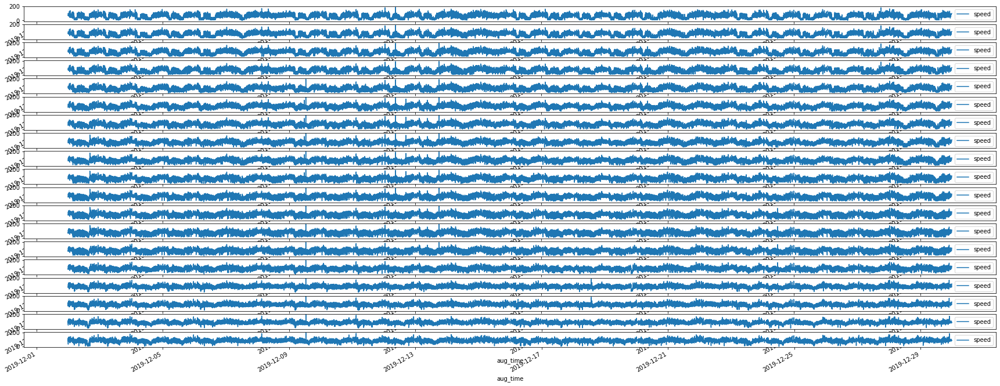

In [6]:
nrows = len(selected_segment_id)

fig, axes = plt.subplots(nrows=nrows, figsize=(30,12), sharey=True)
for i, ax in enumerate(axes):
    aug_data[aug_data["segment_id"] == selected_segment_id[i]].set_index("aug_time").plot(ax=ax, y="speed");

In [7]:
# for s_id in selected_segment_id:
#     stationary_check = sm.tsa.stattools.adfuller(aug_data.loc[aug_data["segment_id"] == s_id,"speed"])
#     print(f"p value is {stationary_check[1]}, segment_id = {s_id} ")

In [8]:
time_bin = "30T"
aug_data = aug_data.groupby("segment_id").apply(lambda x: x.set_index("aug_time").resample(time_bin)["speed"].mean())
aug_data = aug_data.T
aug_data = aug_data.reset_index()
# aug_data = aug_data.unstack(0)

In [9]:
names = ([f"segment_{i}" for i in selected_segment_id])
names.insert(0, "aug_time")
# names.append("int_based")
aug_data.columns = names

In [10]:
aug_data

,aug_time,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66
0,2019-12-02 00:00:00,81.537045,80.626640,79.737036,80.507055,81.167461,79.508472,79.878024,81.010455,81.468223,82.848875,83.752321,84.476510,83.521218,83.675029,83.935074,84.151601,82.891664,84.956570,80.792269
1,2019-12-02 00:30:00,81.914738,81.800427,83.905721,84.906376,86.521198,87.459270,91.071794,92.346953,93.072212,93.139695,92.304122,95.605906,93.824305,93.120637,93.142722,90.105069,92.179962,103.294689,103.229976
2,2019-12-02 01:00:00,83.477050,83.296162,82.864323,83.082706,79.915920,81.579868,83.443065,83.813470,84.665177,85.209129,85.739420,86.169920,86.219027,86.176731,86.917410,88.770794,89.509159,91.288778,90.772966
3,2019-12-02 01:30:00,96.528832,96.076008,93.111836,92.375866,93.601568,90.688855,90.558364,91.733214,93.340960,94.831743,96.078422,96.669147,97.118374,97.178782,98.357765,99.397759,97.351149,102.112012,102.693277
4,2019-12-02 02:00:00,77.797842,79.047852,80.818089,80.602027,78.586402,79.458945,81.681910,83.305114,84.675584,85.718606,86.706565,87.053207,87.215280,87.162122,86.905128,87.394187,86.052027,84.830869,85.029726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1339,2019-12-29 21:30:00,75.077524,74.988244,72.239341,71.120478,70.723484,72.095004,73.587755,76.320613,76.912359,77.171518,77.766487,79.449268,79.404247,79.674574,81.117660,82.091941,83.026379,96.462904,96.785610
1340,2019-12-29 22:00:00,96.199798,94.825678,94.155333,92.707085,91.723730,89.110562,88.922839,90.055619,91.641471,91.102359,91.123659,90.406184,88.362756,88.415661,90.807408,92.145665,92.499845,93.283833,92.018502
1341,2019-12-29 22:30:00,74.892161,79.857025,80.435107,81.042385,81.434598,84.158191,86.042787,86.322659,86.782205,91.390202,92.633437,87.837589,87.200251,86.727156,86.169798,84.761746,84.461913,77.776770,77.881324
1342,2019-12-29 23:00:00,84.929734,80.483866,80.744035,82.197238,77.819009,79.614151,80.550416,82.817197,84.742042,84.263905,86.828976,92.161688,92.296862,91.254329,92.922586,95.230696,95.419944,93.900627,91.209314


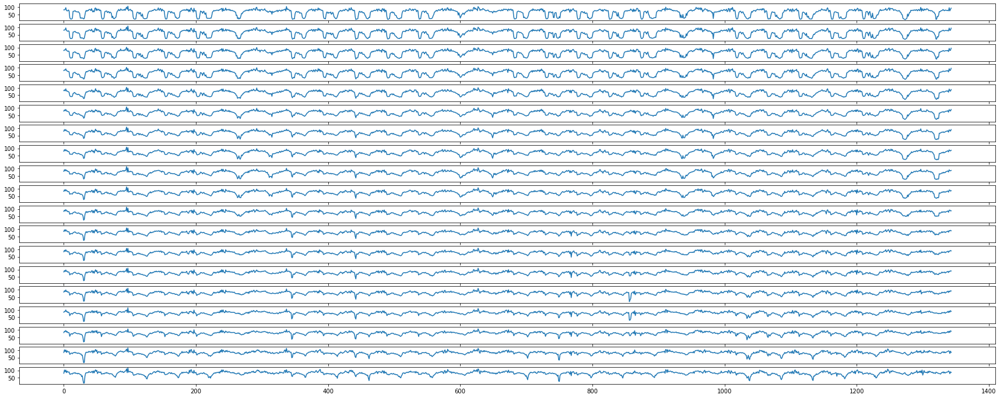

In [11]:
fig, axes = plt.subplots(nrows=nrows, figsize=(30,12), sharey=True)
for i, ax in zip(selected_segment_id,axes):
    aug_data[f"segment_{i}"].plot(ax=ax, y="speed");

In [12]:
aug_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1344 entries, 0 to 1343
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   aug_time    1344 non-null   datetime64[ns]
 1   segment_48  1344 non-null   float64       
 2   segment_49  1344 non-null   float64       
 3   segment_50  1344 non-null   float64       
 4   segment_51  1344 non-null   float64       
 5   segment_52  1344 non-null   float64       
 6   segment_53  1344 non-null   float64       
 7   segment_54  1344 non-null   float64       
 8   segment_55  1344 non-null   float64       
 9   segment_56  1344 non-null   float64       
 10  segment_57  1344 non-null   float64       
 11  segment_58  1344 non-null   float64       
 12  segment_59  1344 non-null   float64       
 13  segment_60  1344 non-null   float64       
 14  segment_61  1344 non-null   float64       
 15  segment_62  1344 non-null   float64       
 16  segment_63  1344 non-nul

### Segment located in front of ODTU is selected (dir = 2, polatli > ankara)

### Stationary check
#### (p value < significance level) --> reject stationay --> the series is non-stationary

### Agregation on time bins & NaNs

In [13]:
time_1 = dt.time.fromisoformat("20:00:00")
time_2 = dt.time.fromisoformat("06:00:00")
aug_data = aug_data.loc[~((aug_data["aug_time"].dt.time > time_1) | (aug_data["aug_time"].dt.time < time_2))]
aug_data = aug_data.loc[~((aug_data["aug_time"].dt.weekday == 6) | (aug_data["aug_time"].dt.weekday == 5))]

In [14]:
# aug_data["int_based"] = np.arange(0,len(aug_data))
# aug_data = aug_data.reset_index()
aug_data = aug_data.reset_index(drop=True)
print(aug_data.info())
print(aug_data.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 580 entries, 0 to 579
Data columns (total 20 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   aug_time    580 non-null    datetime64[ns]
 1   segment_48  580 non-null    float64       
 2   segment_49  580 non-null    float64       
 3   segment_50  580 non-null    float64       
 4   segment_51  580 non-null    float64       
 5   segment_52  580 non-null    float64       
 6   segment_53  580 non-null    float64       
 7   segment_54  580 non-null    float64       
 8   segment_55  580 non-null    float64       
 9   segment_56  580 non-null    float64       
 10  segment_57  580 non-null    float64       
 11  segment_58  580 non-null    float64       
 12  segment_59  580 non-null    float64       
 13  segment_60  580 non-null    float64       
 14  segment_61  580 non-null    float64       
 15  segment_62  580 non-null    float64       
 16  segment_63  580 non-null  

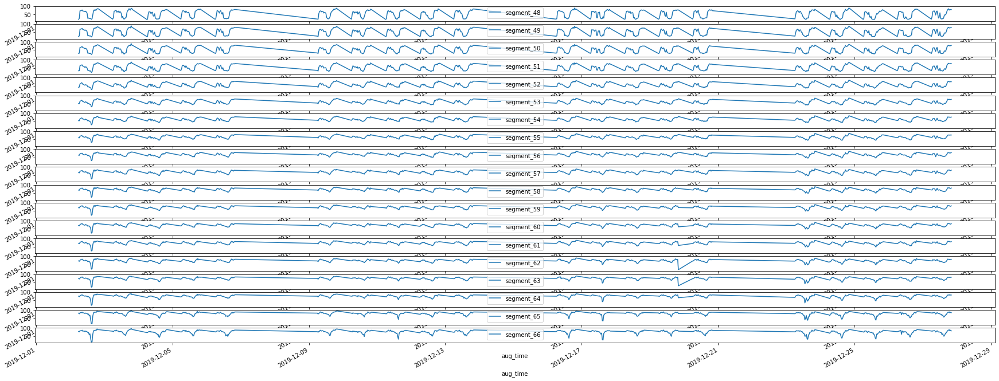

In [15]:
fig, axes = plt.subplots(nrows=nrows, figsize=(30,12), sharey=True)
for i, ax in zip(selected_segment_id,axes):
    aug_data.loc[:, [f"segment_{i}", "aug_time"] ].plot(ax=ax, x="aug_time");

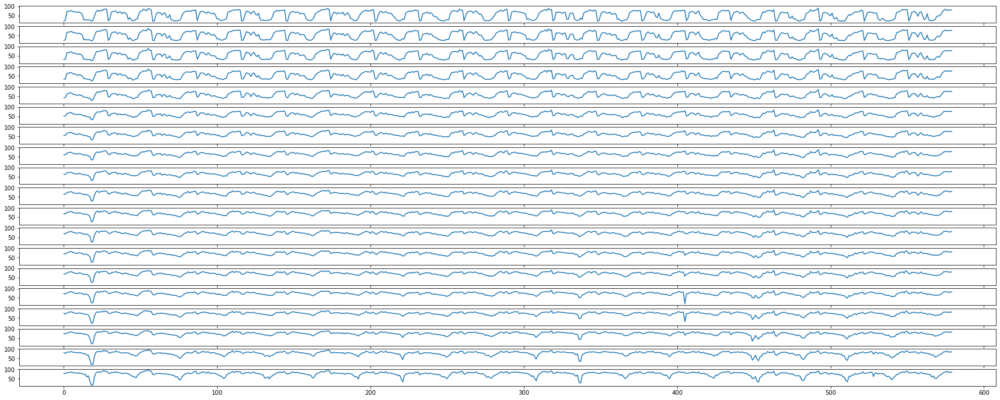

In [16]:
fig, axes = plt.subplots(nrows=nrows, figsize=(30,12), sharey=True)
for i, ax in zip(selected_segment_id,axes):
    aug_data[f"segment_{i}"].plot(ax=ax);

In [17]:
# print(aug_data.loc[aug_data.isna().sum(axis=1) > 1])
aug_data.isna().sum()


aug_time      0
segment_48    0
segment_49    0
segment_50    0
segment_51    0
segment_52    0
segment_53    0
segment_54    0
segment_55    0
segment_56    0
segment_57    0
segment_58    0
segment_59    0
segment_60    0
segment_61    0
segment_62    0
segment_63    0
segment_64    0
segment_65    0
segment_66    0
dtype: int64

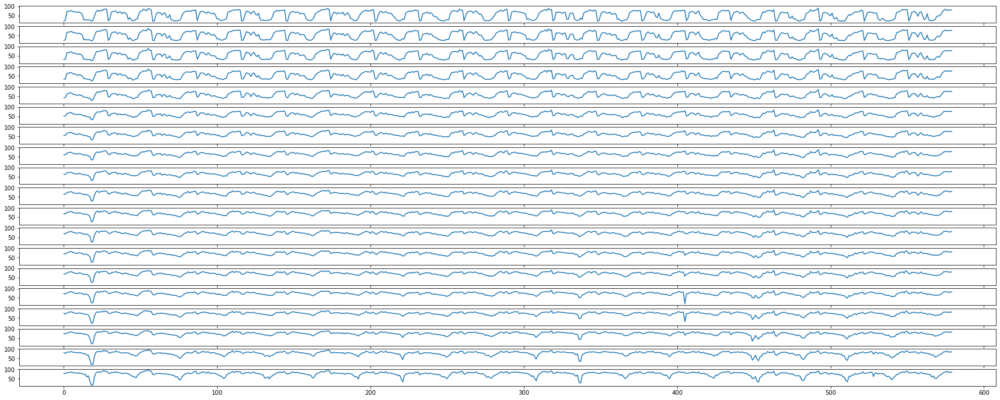

In [18]:
# no need
# aug_data = aug_data.fillna(method="bfill").fillna(method="ffill")
fig, axes = plt.subplots(nrows=nrows, figsize=(30,12), sharey=True)
for i, ax in zip(selected_segment_id,axes):
    aug_data[f"segment_{i}"].plot(ax=ax);

In [19]:
for s_id in selected_segment_id:
    stationary_check = sm.tsa.stattools.adfuller(aug_data[f"segment_{s_id}"])
    print(f"p value is {stationary_check[1]}, segment_id = {s_id} ")

p value is 4.1963634786537426e-22, segment_id = 48 
p value is 1.3784872493245676e-22, segment_id = 49 
p value is 2.6010358819172743e-23, segment_id = 50 
p value is 4.643672519141227e-24, segment_id = 51 
p value is 2.5851193053102745e-24, segment_id = 52 
p value is 1.2686751878321577e-23, segment_id = 53 
p value is 8.85846421557003e-23, segment_id = 54 
p value is 7.735564237481768e-21, segment_id = 55 
p value is 4.875365655051299e-19, segment_id = 56 
p value is 7.512357254524304e-20, segment_id = 57 
p value is 1.7865577433561653e-18, segment_id = 58 
p value is 1.299685879377857e-17, segment_id = 59 
p value is 1.3853615229568206e-17, segment_id = 60 
p value is 2.571987412122566e-17, segment_id = 61 
p value is 2.704384204918105e-16, segment_id = 62 
p value is 1.1915074405814214e-14, segment_id = 63 
p value is 1.4181684864918855e-15, segment_id = 64 
p value is 2.5025968543712347e-15, segment_id = 65 
p value is 3.533283834674247e-18, segment_id = 66 


### Discarding weekend days

#### bir gün 91 datapoint

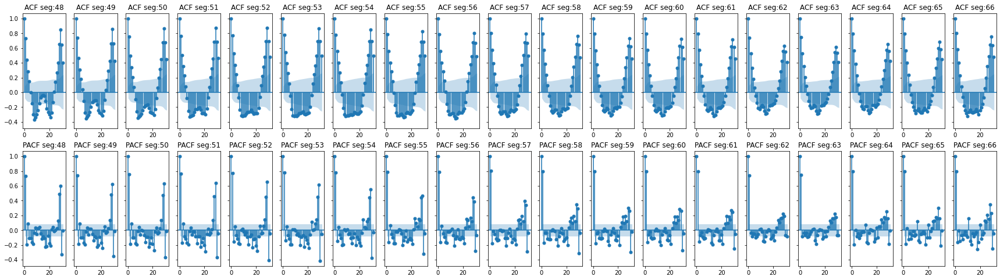

In [20]:
lags=np.arange(0,32,1)
fig, axes = plt.subplots(ncols=len(selected_segment_id), nrows=2, figsize=(30,8), sharey=True)
for i, ax1, ax2 in zip(selected_segment_id, axes[0], axes[1]):
    sm.graphics.tsa.plot_acf(aug_data[f"segment_{i}"], lags=lags, ax=ax1, title=f"ACF seg:{i}");
    sm.graphics.tsa.plot_pacf(aug_data[f"segment_{i}"], lags=lags, ax=ax2, title=f"PACF seg:{i}");

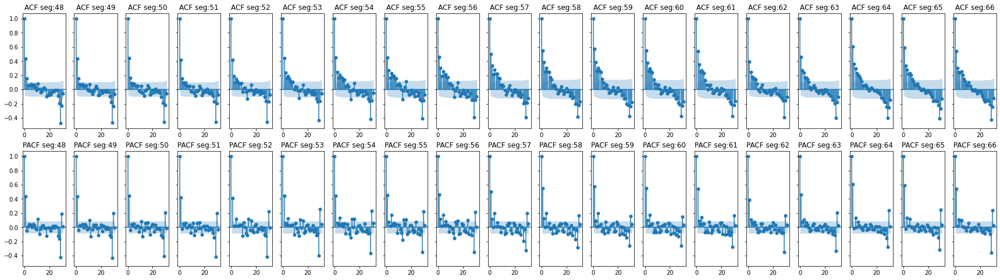

In [21]:
lags=np.arange(0,32,1)
fig, axes = plt.subplots(ncols=len(selected_segment_id), nrows=2, figsize=(30,8), sharey=True)
for i, ax1, ax2 in zip(selected_segment_id, axes[0], axes[1]):
    sm.graphics.tsa.plot_acf(aug_data[f"segment_{i}"].diff(29).dropna(), lags=lags, ax=ax1, title=f"ACF seg:{i}");
    sm.graphics.tsa.plot_pacf(aug_data[f"segment_{i}"].diff(29).dropna(), lags=lags, ax=ax2, title=f"PACF seg:{i}");

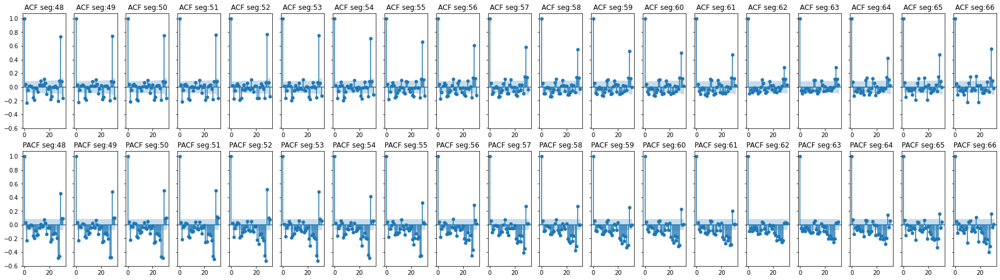

In [22]:
lags=np.arange(0,32,1)
fig, axes = plt.subplots(ncols=len(selected_segment_id), nrows=2, figsize=(30,8), sharey=True)
for i, ax1, ax2 in zip(selected_segment_id, axes[0], axes[1]):
    sm.graphics.tsa.plot_acf(aug_data[f"segment_{i}"].diff().dropna(), lags=lags, ax=ax1, title=f"ACF seg:{i}");
    sm.graphics.tsa.plot_pacf(aug_data[f"segment_{i}"].diff().dropna(), lags=lags, ax=ax2, title=f"PACF seg:{i}");

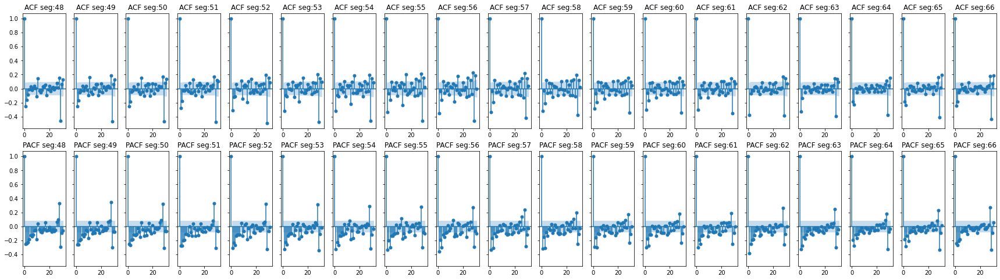

In [23]:
lags=np.arange(0,32,1)
fig, axes = plt.subplots(ncols=len(selected_segment_id), nrows=2, figsize=(30,8), sharey=True)
for i, ax1, ax2 in zip(selected_segment_id, axes[0], axes[1]):
    sm.graphics.tsa.plot_acf(aug_data[f"segment_{i}"].diff(29).diff().dropna(), lags=lags, ax=ax1, title=f"ACF seg:{i}");
    sm.graphics.tsa.plot_pacf(aug_data[f"segment_{i}"].diff(29).diff().dropna(), lags=lags, ax=ax2, title=f"PACF seg:{i}");

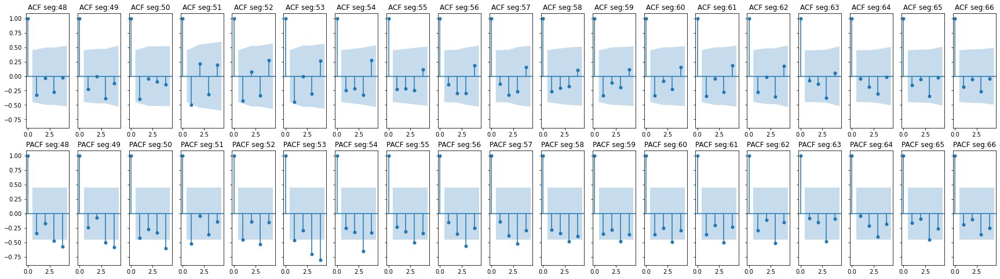

In [24]:
lags=np.arange(0,len(aug_data.iloc[::29,0])/4,1)
fig, axes = plt.subplots(ncols=len(selected_segment_id), nrows=2, figsize=(30,8), sharey=True)
for i, ax1, ax2 in zip(selected_segment_id, axes[0], axes[1]):
    sm.graphics.tsa.plot_acf(aug_data.iloc[::29,aug_data.columns.get_indexer([f"segment_{i}"])].diff().dropna(), lags=lags, ax=ax1, title=f"ACF seg:{i}");
    sm.graphics.tsa.plot_pacf(aug_data.iloc[::29,aug_data.columns.get_indexer([f"segment_{i}"])].diff().dropna(), lags=lags, ax=ax2, title=f"PACF seg:{i}");



# fig, axes = plt.subplots(ncols=len(selected_segment_id), nrows=2, figsize=(30,8), sharey=True)
# for i, ax in enumerate(axes[0]):
#     sm.graphics.tsa.plot_acf(aux_data.iloc[::29,i], lags=lags, ax=axes[0][i],title=f"ACF segment:{selected_segment_id[i]}");
#     sm.graphics.tsa.plot_pacf(aux_data.iloc[::29,i], lags=lags, ax=axes[1][i],title=f"PACF segment:{selected_segment_id[i]}");


In [25]:
def get_arima(series, seasonal_lag, p, d, q, sp, sd, sq):
    
    model = sm.tsa.statespace.SARIMAX(series, order=(p, d, q), seasonal_order=(sp,sd,sq,seasonal_lag), trend="c")
    results = model.fit(maxiter=100)
    return p, d, q, sp, sd, sq, results, model

    
def arima_grid(series, seasonal_lag, arima_coef, seasonal_coef):
    
    out = []
    
    input_p, input_d, input_q = arima_coef
    input_sp, input_sd, input_sq = seasonal_coef
    
    for p in input_p:
        for d in input_d:
            for q in input_q:
                for sp in input_sp:
                    for sd in input_sd:
                        for sq in input_sq:
                            result = get_arima(series, seasonal_lag, p, d, q, sp, sd, sq)
                            result.append(result[-2].aic)
                            result.append(result[-3].bic)
                            out.append(result)
    return out

In [26]:
selected_segment_id

array([48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66])

In [27]:
seasonal_lag = 29
i = 48
p, d, q = 2, 0, 0
sp, sd, sq = 1, 0, 1
results = {}
results["48"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_48"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["49"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_49"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["50"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_50"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["51"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_51"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["52"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_52"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["53"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_53"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["54"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_54"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["55"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_55"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["56"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_56"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["57"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_57"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["58"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_58"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["59"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_59"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["60"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_60"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["61"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_61"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["62"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_62"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["63"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_63"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["64"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_64"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["65"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_65"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)
results["66"] = get_arima(aug_data.loc[aug_data["aug_time"].dt.isocalendar()["week"] < 52, "segment_66"] ,seasonal_lag, 2, 0, 0, 1, 0, 1)

C:\Users\k\miniconda3\envs\jlab2\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\k\miniconda3\envs\jlab2\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
C:\Users\k\miniconda3\envs\jlab2\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\k\miniconda3\envs\jlab2\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
C:\Users\k\miniconda3\envs\jlab2\lib\s

## do not forget to set seasonal_lag in accordanve with time bin

{'fopt': 3.3573689852993964, 'gopt': array([ 1.75680746e-02, -8.44942409e-03,  1.04123485e-02,  1.68173919e-05,
        5.12043385e-04,  9.79134729e-04]), 'fcalls': 882, 'warnflag': 1, 'converged': False, 'iterations': 100}
{'fopt': 3.2105629301328698, 'gopt': array([-2.34546373e-02, -2.85697195e-03, -2.40389295e-03,  2.00130756e-04,
       -3.81611525e-03, -6.11606321e-05]), 'fcalls': 945, 'warnflag': 0, 'converged': True, 'iterations': 94}
{'fopt': 3.07713881706899, 'gopt': array([-4.60606366e-02, -1.25207844e-05,  8.19849477e-04,  5.36967359e-05,
       -5.93947513e-04, -4.20706892e-04]), 'fcalls': 987, 'warnflag': 0, 'converged': True, 'iterations': 97}
{'fopt': 2.962219619588793, 'gopt': array([-3.12778381e-04, -2.13116635e-05, -8.16291923e-05,  3.18949311e-04,
        3.20221449e-04,  1.18225918e-04]), 'fcalls': 518, 'warnflag': 0, 'converged': True, 'iterations': 49}
{'fopt': 2.6849076952866775, 'gopt': array([-0.54719664,  0.0097547 ,  0.0098625 ,  0.00055032,  0.00089512,
    

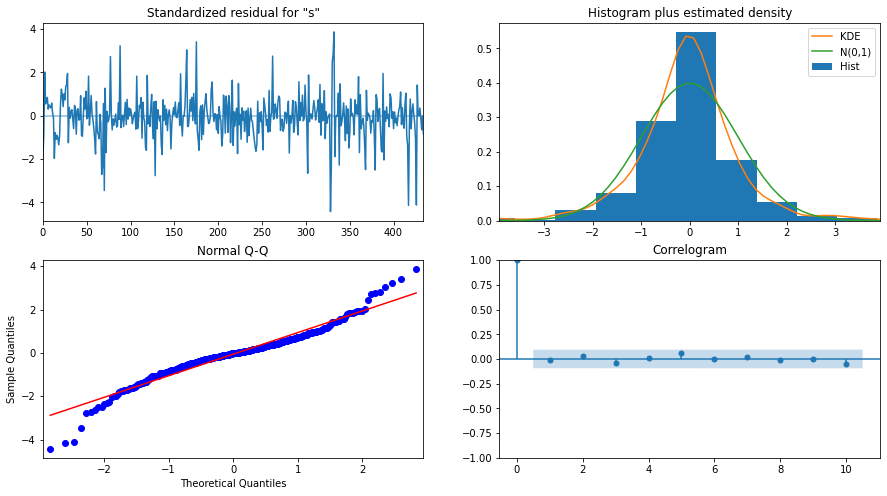

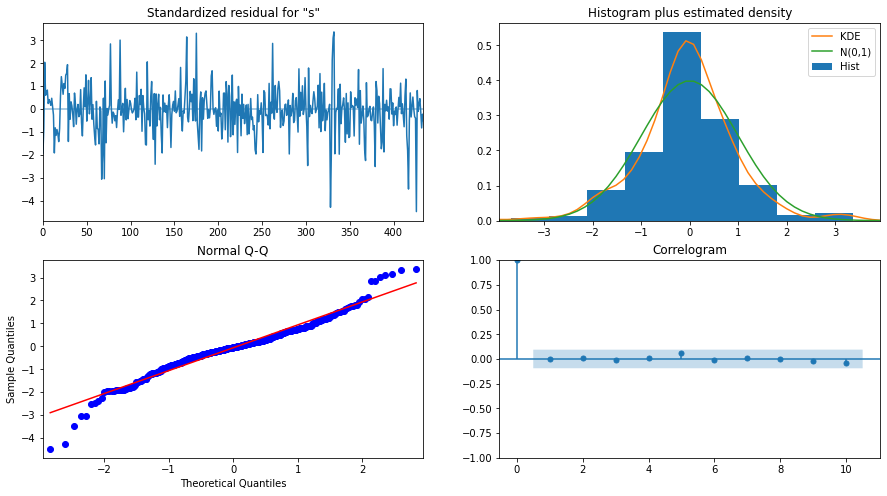

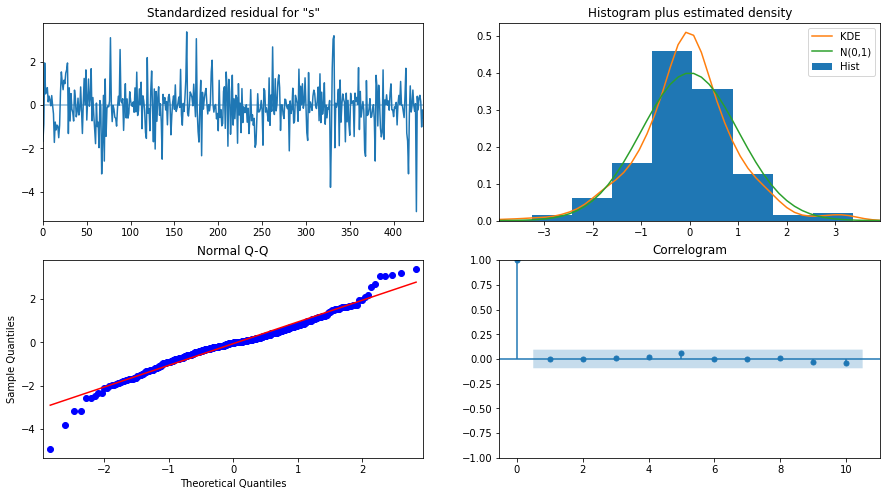

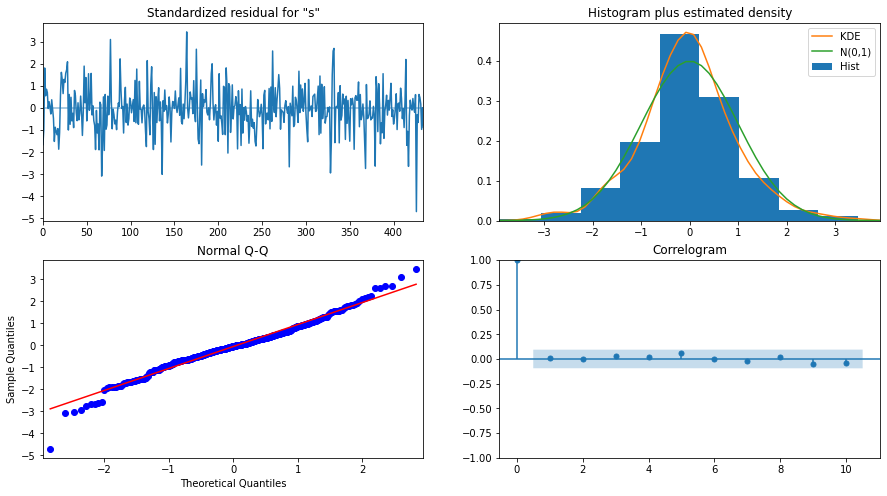

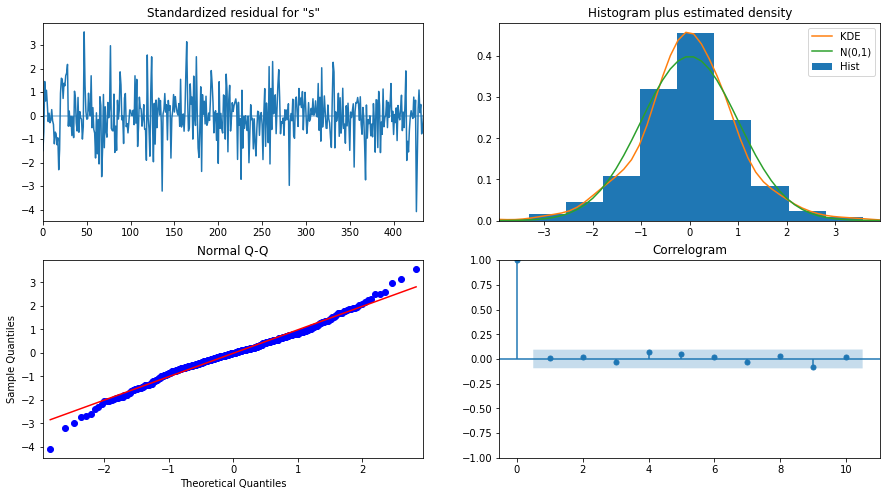

...

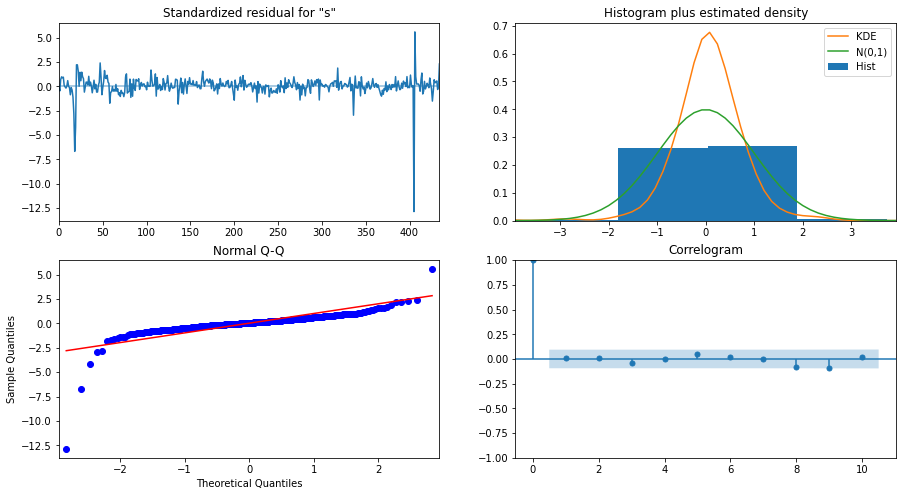

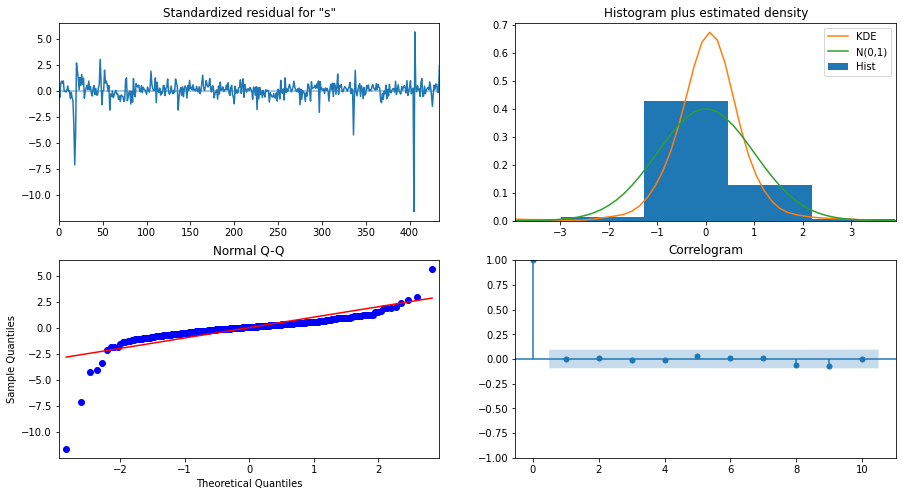

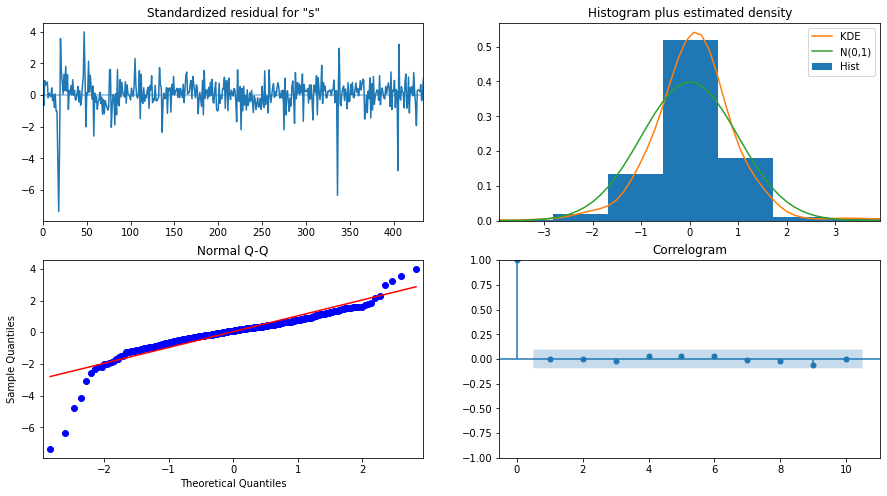

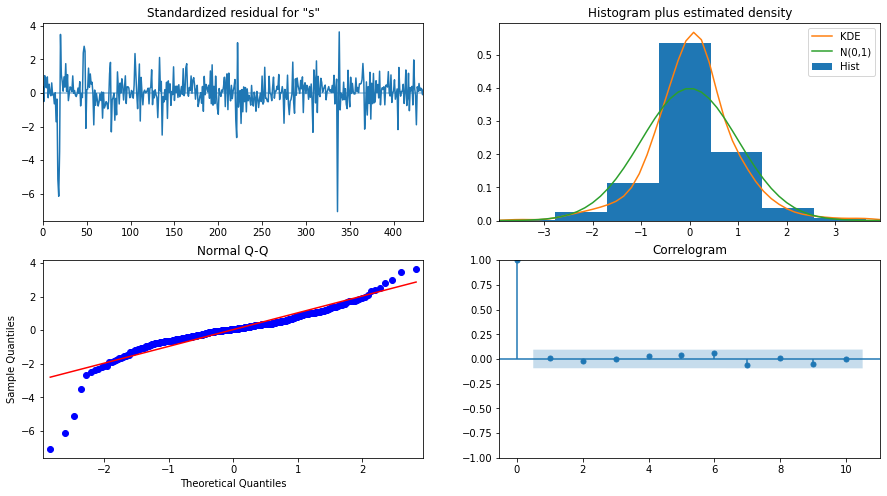

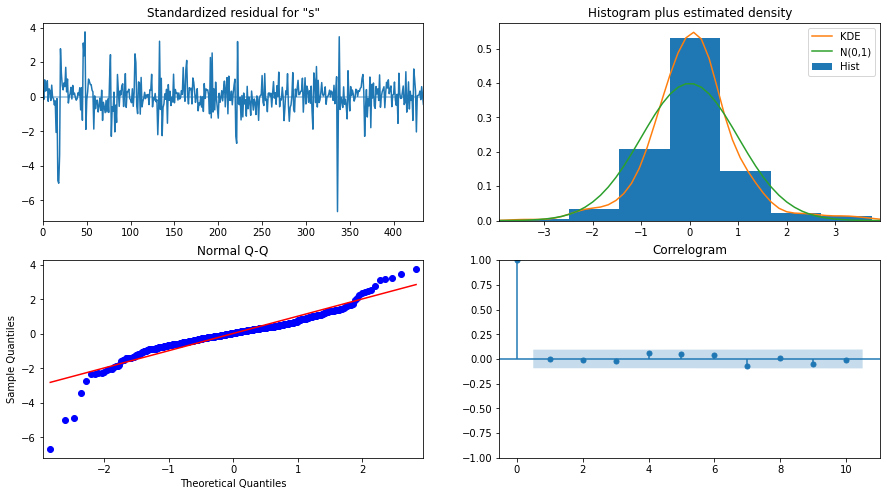

In [28]:
for i in selected_segment_id:
    arima_results = results[f"{i}"][-2]
    model = results[f"{i}"][-1]
    print(arima_results.mle_retvals)
    arima_results.plot_diagnostics(figsize=(15,8));

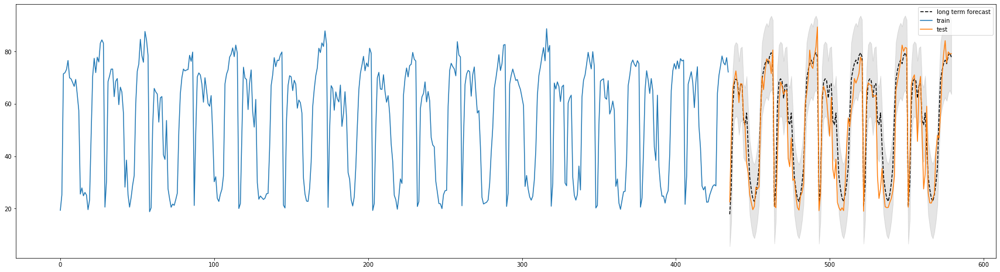

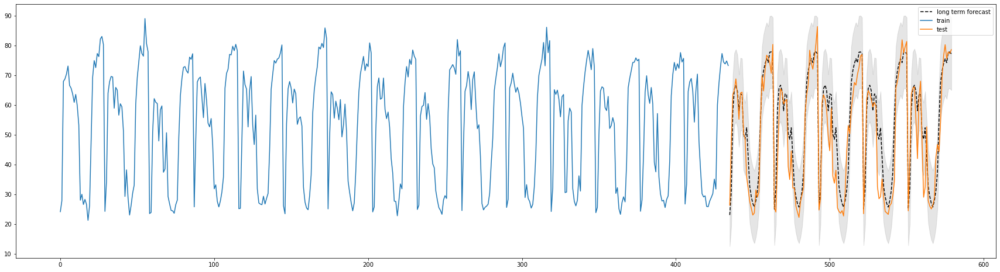

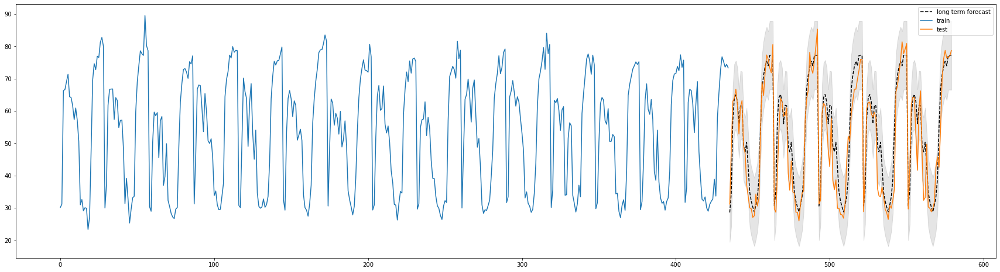

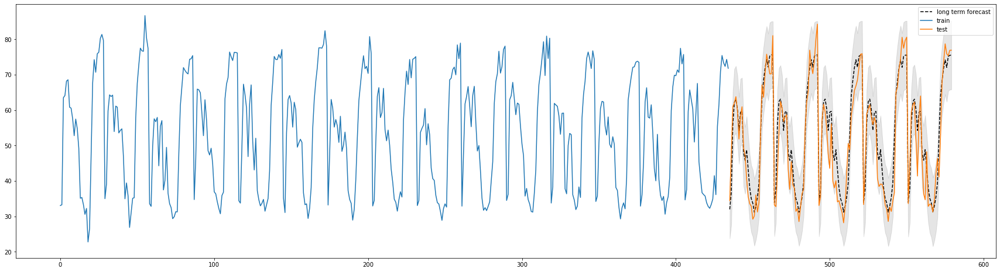

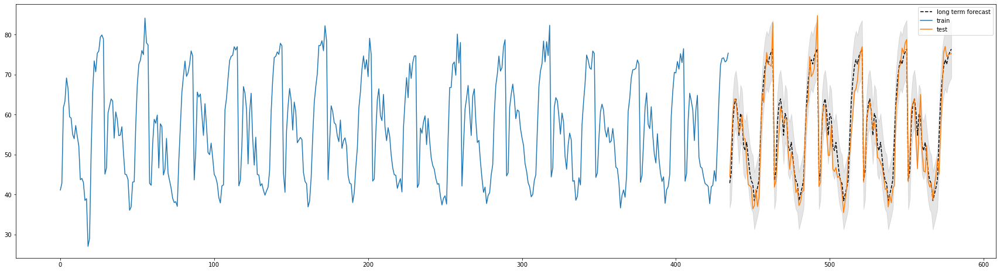

...

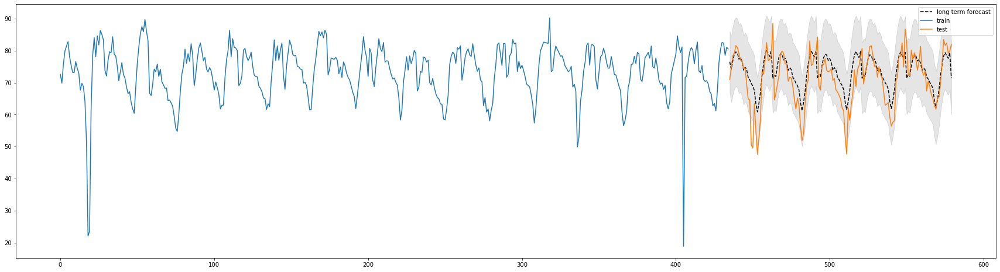

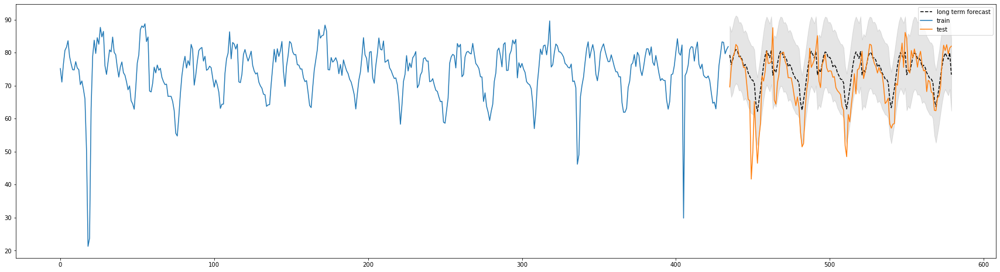

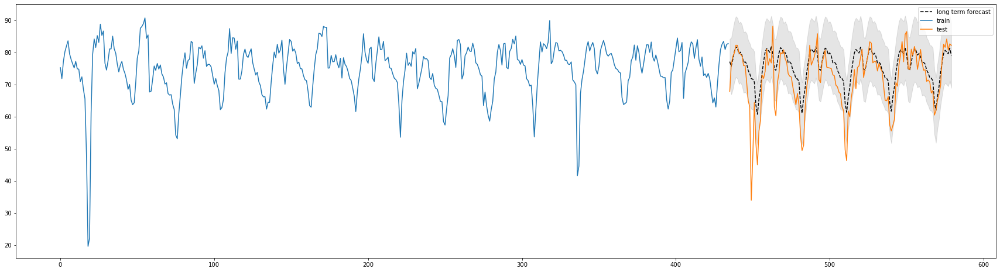

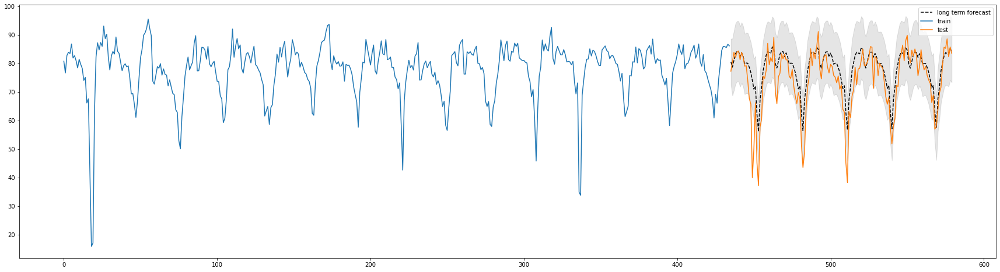

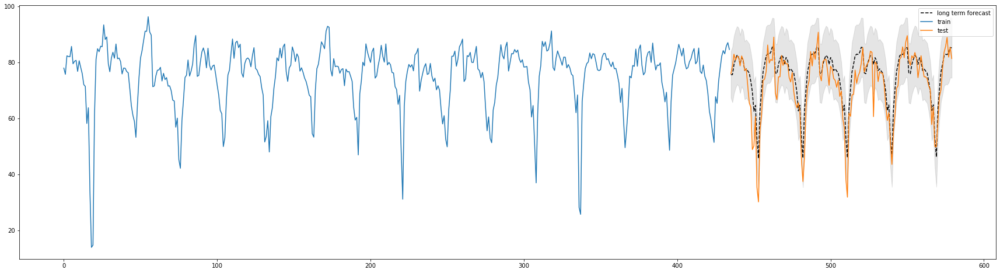

In [29]:
for i in selected_segment_id:    
    fcast_all = results[f"{i}"][-2].get_forecast(seasonal_lag * 5).summary_frame(alpha=0.05)

    fig, ax = plt.subplots(figsize=(30, 8))

    fcast_all['mean'].plot(ax=ax, style='k--', label="long term forecast", legend=True)

    aug_data.iloc[:-seasonal_lag * 5].plot(kind="line", y=f"segment_{i}", ax=ax, label="train", legend=True);
    aug_data.iloc[-seasonal_lag * 5:].plot(kind="line", y=f"segment_{i}", ax=ax, label="test",legend=True);
    ax.fill_between(fcast_all.index, fcast_all['mean_ci_lower'], fcast_all['mean_ci_upper'], color='k', alpha=0.1);

In [30]:
prediction = pd.DataFrame()

for i in selected_segment_id:
    
    fcast = results[f"{i}"][-2].get_forecast(seasonal_lag * 1).summary_frame(alpha=0.05)
    segment_prediction = pd.Series(fcast["mean"])
    dyn_arima_results = results[f"{i}"][-2]
    
    for day in range(1,5):
        dyn_arima_results = dyn_arima_results.append(aug_data.loc[(aug_data["aug_time"].dt.isocalendar()["week"] == 52) & (aug_data["aug_time"].dt.isocalendar()["day"] == day), f"segment_{i}"])
        fcast = dyn_arima_results.get_forecast(seasonal_lag * 1).summary_frame(alpha=0.05)
        segment_prediction = segment_prediction.append(fcast["mean"])
    
    
    segment_prediction = segment_prediction.rename(f"segment_{i}")
    
    prediction = pd.concat([prediction, segment_prediction], axis=1)

In [31]:
prediction

,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66
435,17.828211,23.041930,28.567637,32.004462,42.893754,51.211020,55.930886,59.823922,62.324288,64.475860,66.575381,68.582849,69.978310,71.211487,76.544773,79.268957,77.147462,80.538900,75.590638
436,28.187990,31.020636,34.464169,36.756036,45.530497,52.888369,56.906260,60.190980,62.281101,64.688834,66.893037,68.820850,69.784112,70.537219,74.252091,76.372509,75.727336,78.695566,75.590547
437,59.344116,57.743850,57.144539,55.717926,57.856634,62.151615,64.822621,67.017922,68.914682,71.059009,72.816518,74.141813,74.648833,75.021254,76.824548,77.849386,77.783223,81.005252,79.105332
438,68.147561,65.307955,63.950058,62.204605,62.496037,65.975913,68.066302,69.914641,71.599258,73.815612,75.566146,76.745007,77.282769,77.520846,78.865959,79.967266,80.229204,83.392971,81.110606
439,69.492175,66.504170,64.983521,63.023343,63.883468,66.759066,68.992786,70.842671,72.625882,75.065884,76.915304,78.191158,78.500931,78.697376,79.629573,80.937307,81.796334,84.231583,82.479871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,75.835016,74.831076,74.800034,73.338865,72.805933,73.284736,73.414011,73.359726,73.817968,77.267158,77.369322,77.281744,77.009553,76.967738,77.243439,77.085415,77.839669,81.657959,81.384267
576,75.464912,74.426416,74.177544,72.624448,72.452986,73.305329,73.837642,73.722617,74.033743,77.260653,77.546504,77.848546,77.894858,77.859841,77.865378,78.437576,79.181001,82.782969,82.053975
577,77.840723,76.904474,76.579683,74.567548,74.174667,74.317509,74.872053,74.187593,73.839045,76.374349,76.478747,76.517601,76.262172,76.280709,76.687637,76.804549,78.124722,81.645188,81.937005
578,79.156082,77.500736,77.127130,75.988809,75.645252,76.258444,77.077183,78.041501,78.512696,79.508432,79.842327,80.099059,80.103457,80.229291,80.186727,80.394408,81.133118,84.665159,84.466091


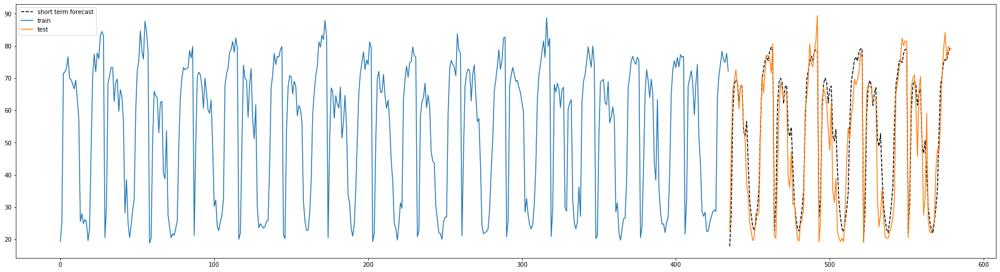

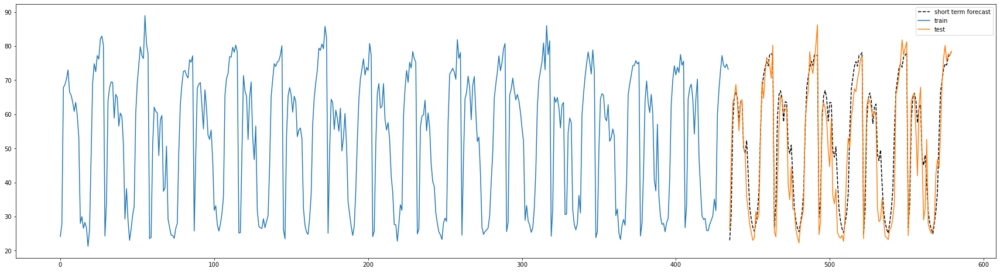

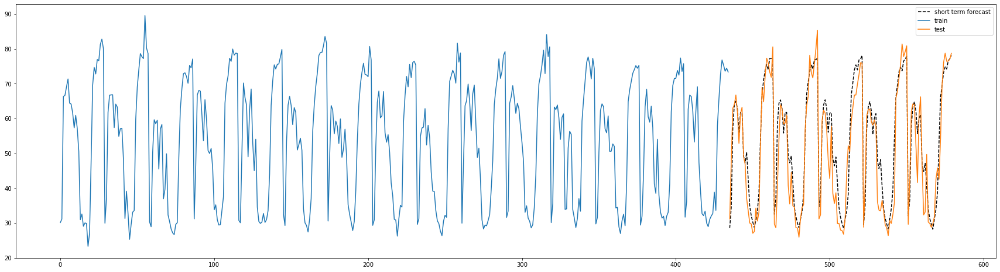

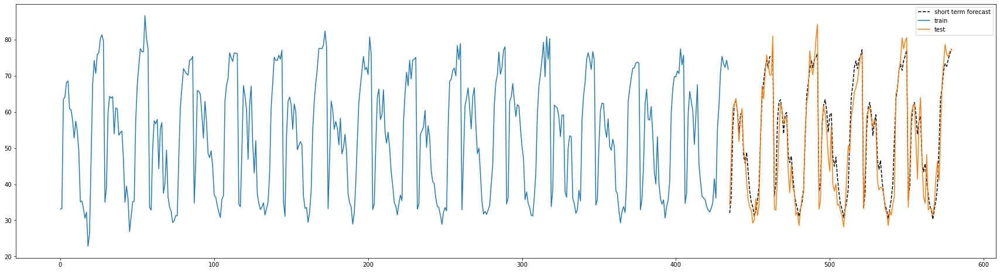

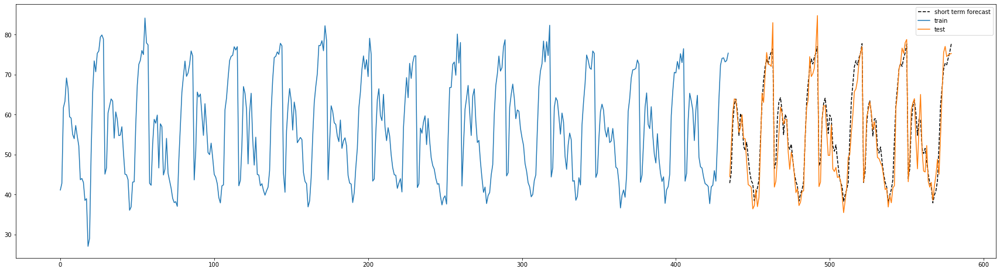

...

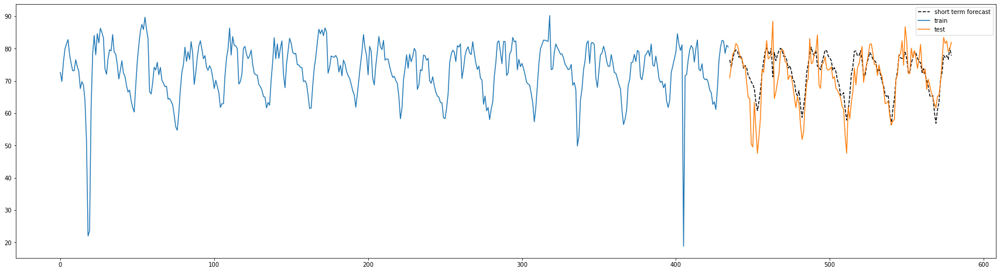

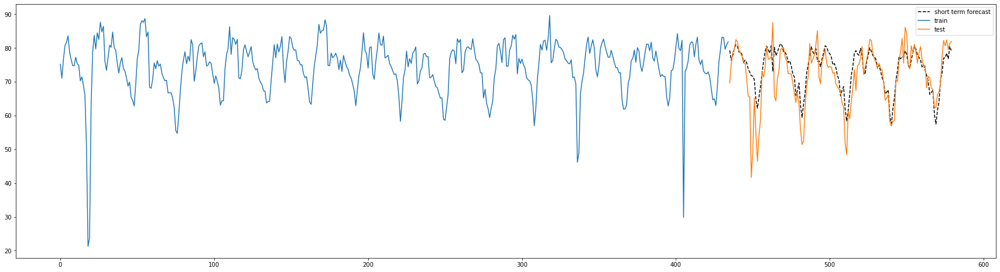

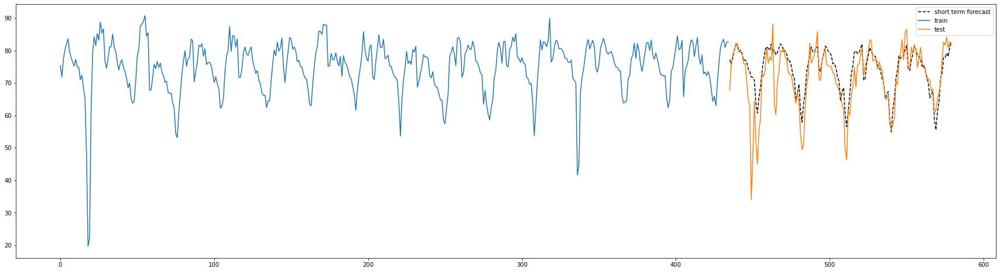

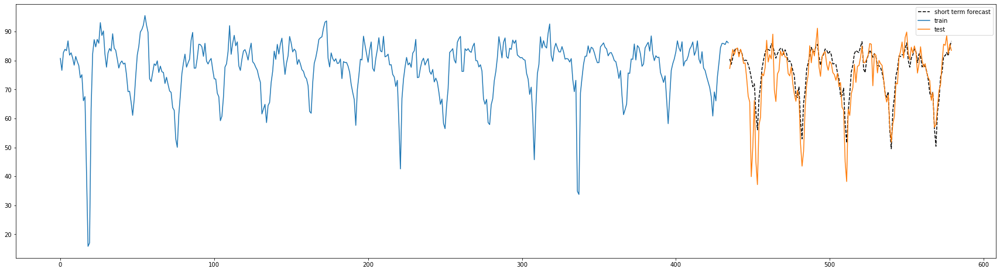

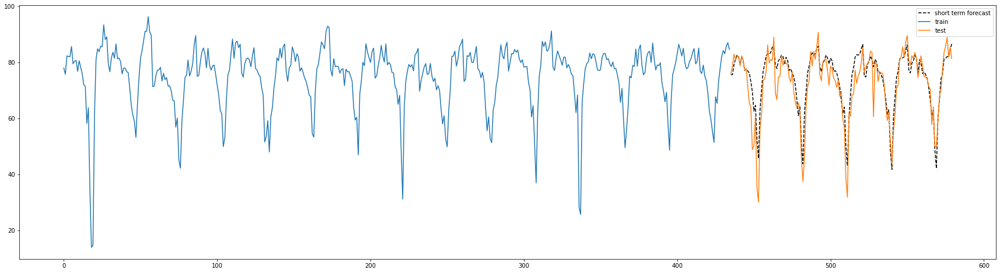

In [32]:
for segment_id in selected_segment_id:
# segment_id = 52

    fig, ax = plt.subplots(figsize=(30, 8))

    prediction.plot(ax=ax, style='k--', label="short term forecast", y=f"segment_{segment_id}", legend=True)
    aug_data.iloc[:-seasonal_lag * 5].plot(kind="line", y=f"segment_{segment_id}", ax=ax, label="train", legend=True);
    aug_data.iloc[-seasonal_lag * 5:].plot(kind="line", y=f"segment_{segment_id}", ax=ax, label="test",legend=True);


In [33]:
# # one day forecast
# fcast = results[f"48"][-2].get_forecast(seasonal_lag * 1).summary_frame(alpha=0.05)

# # collect
# prediction = pd.Series(fcast["mean"])

# #plot
# fig, ax = plt.subplots(figsize=(30, 8))
# fcast['mean'].plot(ax=ax, style='k--', label="1 forecast", legend=True)
# aug_data.iloc[:-seasonal_lag * 5].plot(kind="line", y="segment_48", ax=ax, label="train", legend=True);
# aug_data.iloc[-seasonal_lag * 5:].plot(kind="line", y="segment_48", ax=ax, label="test",legend=True);
# fcast_all['mean'].plot(ax=ax, style='m--', label="5 forecast", legend=True)
# ax.fill_between(fcast_all.index, fcast_all['mean_ci_lower'], fcast_all['mean_ci_upper'], color='y', alpha=0.1);
# ax.fill_between(fcast.index, fcast['mean_ci_lower'], fcast['mean_ci_upper'], color='b', alpha=0.1);

# # copy arima result object
# dyn_arima_results = results[f"48"][-2]

# for i in range(1,5):
#     # append true data to arima model to make dynamic forecast
#     dyn_arima_results = dyn_arima_results.append(aug_data.loc[(aug_data["aug_time"].dt.isocalendar()["week"] == 52) & (aug_data["aug_time"].dt.isocalendar()["day"] == i), "segment_48"])
#     # make 1 day forecast
#     fcast = dyn_arima_results.get_forecast(seasonal_lag * 1).summary_frame(alpha=0.05)
#     #collect
#     prediction = prediction.append(fcast["mean"])
    
#     # plot
#     fig, ax = plt.subplots(figsize=(30, 8))
    
#     fcast['mean'].plot(ax=ax, style='k--', label="1 forecast", legend=True)
#     aug_data.iloc[:-seasonal_lag * 5].plot(kind="line",y="segment_48", ax=ax, label="train", legend=True);
#     aug_data.iloc[-seasonal_lag * 5:].plot(kind="line",y="segment_48", ax=ax, label="test",legend=True);
#     fcast_all['mean'].plot(ax=ax, style='m--', label="5 forecast", legend=True)
#     ax.fill_between(fcast_all.index, fcast_all['mean_ci_lower'], fcast_all['mean_ci_upper'], color='y', alpha=0.1);
#     ax.fill_between(fcast.index, fcast['mean_ci_lower'], fcast['mean_ci_upper'], color='b', alpha=0.1);
    
# prediction = prediction.rename("segment_48_forecast")

In [34]:
# prediction

In [35]:
true = aug_data.iloc[-seasonal_lag * 5:,1:]
# true

In [36]:
static_prediction = pd.concat(
    [results[f"{segment}"][-2].get_forecast(seasonal_lag * 5).summary_frame(alpha=0.05)["mean"] for segment in selected_segment_id],
    axis=1)
static_prediction.columns= [f"segment_{segment}" for segment in selected_segment_id]

In [37]:
# error_df = pd.DataFrame(((true - prediction)/true).abs().mean())
# error_df.columns = ["mape"]
# error_df["rmse"] = np.sqrt((((true - prediction) ** 2).mean()))
# error_df


In [38]:
prediction

,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66
435,17.828211,23.041930,28.567637,32.004462,42.893754,51.211020,55.930886,59.823922,62.324288,64.475860,66.575381,68.582849,69.978310,71.211487,76.544773,79.268957,77.147462,80.538900,75.590638
436,28.187990,31.020636,34.464169,36.756036,45.530497,52.888369,56.906260,60.190980,62.281101,64.688834,66.893037,68.820850,69.784112,70.537219,74.252091,76.372509,75.727336,78.695566,75.590547
437,59.344116,57.743850,57.144539,55.717926,57.856634,62.151615,64.822621,67.017922,68.914682,71.059009,72.816518,74.141813,74.648833,75.021254,76.824548,77.849386,77.783223,81.005252,79.105332
438,68.147561,65.307955,63.950058,62.204605,62.496037,65.975913,68.066302,69.914641,71.599258,73.815612,75.566146,76.745007,77.282769,77.520846,78.865959,79.967266,80.229204,83.392971,81.110606
439,69.492175,66.504170,64.983521,63.023343,63.883468,66.759066,68.992786,70.842671,72.625882,75.065884,76.915304,78.191158,78.500931,78.697376,79.629573,80.937307,81.796334,84.231583,82.479871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,75.835016,74.831076,74.800034,73.338865,72.805933,73.284736,73.414011,73.359726,73.817968,77.267158,77.369322,77.281744,77.009553,76.967738,77.243439,77.085415,77.839669,81.657959,81.384267
576,75.464912,74.426416,74.177544,72.624448,72.452986,73.305329,73.837642,73.722617,74.033743,77.260653,77.546504,77.848546,77.894858,77.859841,77.865378,78.437576,79.181001,82.782969,82.053975
577,77.840723,76.904474,76.579683,74.567548,74.174667,74.317509,74.872053,74.187593,73.839045,76.374349,76.478747,76.517601,76.262172,76.280709,76.687637,76.804549,78.124722,81.645188,81.937005
578,79.156082,77.500736,77.127130,75.988809,75.645252,76.258444,77.077183,78.041501,78.512696,79.508432,79.842327,80.099059,80.103457,80.229291,80.186727,80.394408,81.133118,84.665159,84.466091


In [39]:
prediction

,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66
435,17.828211,23.041930,28.567637,32.004462,42.893754,51.211020,55.930886,59.823922,62.324288,64.475860,66.575381,68.582849,69.978310,71.211487,76.544773,79.268957,77.147462,80.538900,75.590638
436,28.187990,31.020636,34.464169,36.756036,45.530497,52.888369,56.906260,60.190980,62.281101,64.688834,66.893037,68.820850,69.784112,70.537219,74.252091,76.372509,75.727336,78.695566,75.590547
437,59.344116,57.743850,57.144539,55.717926,57.856634,62.151615,64.822621,67.017922,68.914682,71.059009,72.816518,74.141813,74.648833,75.021254,76.824548,77.849386,77.783223,81.005252,79.105332
438,68.147561,65.307955,63.950058,62.204605,62.496037,65.975913,68.066302,69.914641,71.599258,73.815612,75.566146,76.745007,77.282769,77.520846,78.865959,79.967266,80.229204,83.392971,81.110606
439,69.492175,66.504170,64.983521,63.023343,63.883468,66.759066,68.992786,70.842671,72.625882,75.065884,76.915304,78.191158,78.500931,78.697376,79.629573,80.937307,81.796334,84.231583,82.479871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,75.835016,74.831076,74.800034,73.338865,72.805933,73.284736,73.414011,73.359726,73.817968,77.267158,77.369322,77.281744,77.009553,76.967738,77.243439,77.085415,77.839669,81.657959,81.384267
576,75.464912,74.426416,74.177544,72.624448,72.452986,73.305329,73.837642,73.722617,74.033743,77.260653,77.546504,77.848546,77.894858,77.859841,77.865378,78.437576,79.181001,82.782969,82.053975
577,77.840723,76.904474,76.579683,74.567548,74.174667,74.317509,74.872053,74.187593,73.839045,76.374349,76.478747,76.517601,76.262172,76.280709,76.687637,76.804549,78.124722,81.645188,81.937005
578,79.156082,77.500736,77.127130,75.988809,75.645252,76.258444,77.077183,78.041501,78.512696,79.508432,79.842327,80.099059,80.103457,80.229291,80.186727,80.394408,81.133118,84.665159,84.466091


In [40]:
prediction["aug_time"] = aug_data["aug_time"]

error_df = pd.DataFrame(((true - prediction) / true).abs().groupby(prediction["aug_time"].dt.day).mean().mean(axis=1))
error_df.columns = ["mape_short"]
error_df["rmse_short"] = np.sqrt( ((true - prediction) ** 2).groupby(prediction["aug_time"].dt.day).mean()).mean(axis=1)
error_df["mape_long"] = ((true - static_prediction) / true).abs().groupby(prediction["aug_time"].dt.day).mean().mean(axis=1)
error_df["rmse_long"] = np.sqrt(((true - static_prediction) ** 2).groupby(prediction["aug_time"].dt.day).mean()).mean(axis=1)
error_df.index = [f"day_{x}" for x in error_df.index]
error_df

,mape_short,rmse_short,mape_long,rmse_long
day_23,0.080550,5.968508,0.080550,5.968508
day_24,0.070466,5.146104,0.071106,4.991098
day_25,0.087658,5.527285,0.094247,6.102137
day_26,0.051607,3.670639,0.065754,4.560201
day_27,0.053875,3.960052,0.055091,4.017503


In [41]:
peak_hours = pd.date_range("07:00 2018-01-01", periods=7, freq="30T")
peak_hours = peak_hours.append(pd.date_range("16:00 2018-01-01", periods=7, freq="30T"))
peak_hours_index = prediction.loc[prediction["aug_time"].dt.time.isin(peak_hours.time),:].index




In [42]:
multi_index = pd.MultiIndex.from_product([["overall","peak hours", "off peak hours"],["mape_short", "rmse_short", "mape_long","rmse_long"]])

error = pd.DataFrame(np.zeros((len(multi_index),5)), index=multi_index)

error.columns = np.arange(23,28)

error = error.T

error

overall                                peak hours                       \
   mape_short rmse_short mape_long rmse_long mape_short rmse_short mape_long   
23        0.0        0.0       0.0       0.0        0.0        0.0       0.0   
24        0.0        0.0       0.0       0.0        0.0        0.0       0.0   
25        0.0        0.0       0.0       0.0        0.0        0.0       0.0   
26        0.0        0.0       0.0       0.0        0.0        0.0       0.0   
27        0.0        0.0       0.0       0.0        0.0        0.0       0.0   

             off peak hours                                 
   rmse_long     mape_short rmse_short mape_long rmse_long  
23       0.0            0.0        0.0       0.0       0.0  
24       0.0            0.0        0.0       0.0       0.0  
25       0.0            0.0        0.0       0.0       0.0  
26       0.0            0.0        0.0       0.0       0.0  
27       0.0            0.0        0.0       0.0       0.0

In [43]:
# error["overall","mape_short"] = 5

# overall
error["overall","mape_short"] = ((true - prediction) / true).abs().groupby(prediction["aug_time"].dt.day).mean().mean(axis=1)
error["overall","mape_long"] = ((true - static_prediction) / true).abs().groupby(prediction["aug_time"].dt.day).mean().mean(axis=1)

error["overall", "rmse_short"] = np.sqrt( ((true - prediction) ** 2).groupby(prediction["aug_time"].dt.day).mean()).mean(axis=1)
error["overall", "rmse_long"] = np.sqrt( ((true - static_prediction) ** 2).groupby(prediction["aug_time"].dt.day).mean()).mean(axis=1)



error["peak hours","mape_short"] = ((true.loc[peak_hours_index] - prediction.loc[peak_hours_index]) / true.loc[peak_hours_index]).abs().groupby(prediction.loc[peak_hours_index, "aug_time"].dt.day).mean().mean(axis=1)
error["peak hours","mape_long"] = ((true.loc[peak_hours_index] - static_prediction.loc[peak_hours_index]) / true.loc[peak_hours_index]).abs().groupby(prediction.loc[peak_hours_index, "aug_time"].dt.day).mean().mean(axis=1)

error["peak hours", "rmse_short"] = np.sqrt( ((true.loc[peak_hours_index] - prediction.loc[peak_hours_index]) ** 2).groupby(prediction.loc[peak_hours_index, "aug_time"].dt.day).mean()).mean(axis=1)
error["peak hours", "rmse_long"] = np.sqrt( ((true.loc[peak_hours_index] - static_prediction.loc[peak_hours_index]) ** 2).groupby(prediction.loc[peak_hours_index, "aug_time"].dt.day).mean()).mean(axis=1)



error["off peak hours","mape_short"] = ((true.drop(peak_hours_index) - prediction.drop(peak_hours_index)) / true.drop(peak_hours_index)).abs().groupby(prediction.drop(peak_hours_index)["aug_time"].dt.day).mean().mean(axis=1)
error["off peak hours","mape_long"] = ((true.drop(peak_hours_index) - static_prediction.drop(peak_hours_index)) / true.drop(peak_hours_index)).abs().groupby(prediction.drop(peak_hours_index)["aug_time"].dt.day).mean().mean(axis=1)

error["off peak hours", "rmse_short"] = np.sqrt( ((true.drop(peak_hours_index) - prediction.drop(peak_hours_index)) ** 2).groupby(prediction.drop(peak_hours_index)["aug_time"].dt.day).mean()).mean(axis=1)
error["off peak hours", "rmse_long"] = np.sqrt( ((true.drop(peak_hours_index) - static_prediction.drop(peak_hours_index)) ** 2).groupby(prediction.drop(peak_hours_index)["aug_time"].dt.day).mean()).mean(axis=1)

error.index = [f"day_{x}" for x in error.index]


In [44]:
error

overall                                peak hours             \
       mape_short rmse_short mape_long rmse_long mape_short rmse_short   
day_23   0.080550   5.968508  0.080550  5.968508   0.032616   2.955587   
day_24   0.070466   5.146104  0.071106  4.991098   0.052061   4.456537   
day_25   0.087658   5.527285  0.094247  6.102137   0.077210   5.776914   
day_26   0.051607   3.670639  0.065754  4.560201   0.041366   3.755428   
day_27   0.053875   3.960052  0.055091  4.017503   0.052748   4.310219   

                           off peak hours                                 
       mape_long rmse_long     mape_short rmse_short mape_long rmse_long  
day_23  0.032616  2.955587       0.125288   7.759709  0.125288  7.759709  
day_24  0.049710  4.152064       0.087644   5.638647  0.091075  5.577373  
day_25  0.080997  6.130749       0.097410   5.207041  0.106614  5.987773  
day_26  0.048161  4.282992       0.061165   3.470268  0.082174  4.685612  
day_27  0.054355  4.334896       0.054927   3.500837  0.055777  3.479315

In [45]:
error.to_excel("odtu.xlsx")

In [46]:
prediction

,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66,aug_time
435,17.828211,23.041930,28.567637,32.004462,42.893754,51.211020,55.930886,59.823922,62.324288,64.475860,66.575381,68.582849,69.978310,71.211487,76.544773,79.268957,77.147462,80.538900,75.590638,2019-12-23 06:00:00
436,28.187990,31.020636,34.464169,36.756036,45.530497,52.888369,56.906260,60.190980,62.281101,64.688834,66.893037,68.820850,69.784112,70.537219,74.252091,76.372509,75.727336,78.695566,75.590547,2019-12-23 06:30:00
437,59.344116,57.743850,57.144539,55.717926,57.856634,62.151615,64.822621,67.017922,68.914682,71.059009,72.816518,74.141813,74.648833,75.021254,76.824548,77.849386,77.783223,81.005252,79.105332,2019-12-23 07:00:00
438,68.147561,65.307955,63.950058,62.204605,62.496037,65.975913,68.066302,69.914641,71.599258,73.815612,75.566146,76.745007,77.282769,77.520846,78.865959,79.967266,80.229204,83.392971,81.110606,2019-12-23 07:30:00
439,69.492175,66.504170,64.983521,63.023343,63.883468,66.759066,68.992786,70.842671,72.625882,75.065884,76.915304,78.191158,78.500931,78.697376,79.629573,80.937307,81.796334,84.231583,82.479871,2019-12-23 08:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,75.835016,74.831076,74.800034,73.338865,72.805933,73.284736,73.414011,73.359726,73.817968,77.267158,77.369322,77.281744,77.009553,76.967738,77.243439,77.085415,77.839669,81.657959,81.384267,2019-12-27 18:00:00
576,75.464912,74.426416,74.177544,72.624448,72.452986,73.305329,73.837642,73.722617,74.033743,77.260653,77.546504,77.848546,77.894858,77.859841,77.865378,78.437576,79.181001,82.782969,82.053975,2019-12-27 18:30:00
577,77.840723,76.904474,76.579683,74.567548,74.174667,74.317509,74.872053,74.187593,73.839045,76.374349,76.478747,76.517601,76.262172,76.280709,76.687637,76.804549,78.124722,81.645188,81.937005,2019-12-27 19:00:00
578,79.156082,77.500736,77.127130,75.988809,75.645252,76.258444,77.077183,78.041501,78.512696,79.508432,79.842327,80.099059,80.103457,80.229291,80.186727,80.394408,81.133118,84.665159,84.466091,2019-12-27 19:30:00


In [47]:
prediction.loc[prediction["aug_time"].dt.day == 23]

,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66,aug_time
435,17.828211,23.041930,28.567637,32.004462,42.893754,51.211020,55.930886,59.823922,62.324288,64.475860,66.575381,68.582849,69.978310,71.211487,76.544773,79.268957,77.147462,80.538900,75.590638,2019-12-23 06:00:00
436,28.187990,31.020636,34.464169,36.756036,45.530497,52.888369,56.906260,60.190980,62.281101,64.688834,66.893037,68.820850,69.784112,70.537219,74.252091,76.372509,75.727336,78.695566,75.590547,2019-12-23 06:30:00
437,59.344116,57.743850,57.144539,55.717926,57.856634,62.151615,64.822621,67.017922,68.914682,71.059009,72.816518,74.141813,74.648833,75.021254,76.824548,77.849386,77.783223,81.005252,79.105332,2019-12-23 07:00:00
438,68.147561,65.307955,63.950058,62.204605,62.496037,65.975913,68.066302,69.914641,71.599258,73.815612,75.566146,76.745007,77.282769,77.520846,78.865959,79.967266,80.229204,83.392971,81.110606,2019-12-23 07:30:00
439,69.492175,66.504170,64.983521,63.023343,63.883468,66.759066,68.992786,70.842671,72.625882,75.065884,76.915304,78.191158,78.500931,78.697376,79.629573,80.937307,81.796334,84.231583,82.479871,2019-12-23 08:00:00
440,68.776057,64.647368,62.772348,60.344272,60.788586,63.869195,66.526858,68.872291,71.218468,74.170013,76.303001,77.833405,78.218214,78.489680,79.233493,80.511221,81.290016,84.225466,81.964520,2019-12-23 08:30:00
441,62.227020,57.997031,56.005525,54.243867,54.799835,58.703032,61.363044,63.759785,66.032775,69.635169,72.642860,75.056003,75.759947,76.070916,77.335686,78.770084,79.625154,82.387759,79.310388,2019-12-23 09:00:00
442,67.213130,63.649997,61.742032,59.416866,60.271371,63.745494,65.925485,67.697595,68.908464,72.410896,74.900326,76.397252,76.823481,77.001931,77.880902,78.914420,80.119193,83.763337,81.745338,2019-12-23 09:30:00
443,67.749248,63.419058,61.601922,59.682614,59.076140,62.341355,64.420696,66.194501,67.841369,71.067741,73.501426,75.052637,75.394771,75.495060,76.536015,77.968239,79.080411,82.451002,80.710279,2019-12-23 10:00:00
444,53.523583,50.201083,49.180283,47.930785,52.126835,57.236470,60.224629,62.995392,64.680985,67.411800,69.999667,71.813463,72.224282,72.452581,73.923873,75.812615,76.869476,79.769268,77.088053,2019-12-23 10:30:00


In [48]:
dti = pd.date_range("07:00 2018-01-01", periods=7, freq="30T")

In [49]:
dti = dti.append(pd.date_range("16:00 2018-01-01", periods=7, freq="30T"))

In [50]:
dti.time

array([datetime.time(7, 0), datetime.time(7, 30), datetime.time(8, 0),
       datetime.time(8, 30), datetime.time(9, 0), datetime.time(9, 30),
       datetime.time(10, 0), datetime.time(16, 0), datetime.time(16, 30),
       datetime.time(17, 0), datetime.time(17, 30), datetime.time(18, 0),
       datetime.time(18, 30), datetime.time(19, 0)], dtype=object)

In [51]:
aq = prediction["aug_time"].dt.time

aq.iloc[0]

datetime.time(6, 0)

In [52]:
pd.date_range("11:00", "21:30", freq="30min")

DatetimeIndex(['2021-07-08 11:00:00', '2021-07-08 11:30:00',
               '2021-07-08 12:00:00', '2021-07-08 12:30:00',
               '2021-07-08 13:00:00', '2021-07-08 13:30:00',
               '2021-07-08 14:00:00', '2021-07-08 14:30:00',
               '2021-07-08 15:00:00', '2021-07-08 15:30:00',
               '2021-07-08 16:00:00', '2021-07-08 16:30:00',
               '2021-07-08 17:00:00', '2021-07-08 17:30:00',
               '2021-07-08 18:00:00', '2021-07-08 18:30:00',
               '2021-07-08 19:00:00', '2021-07-08 19:30:00',
               '2021-07-08 20:00:00', '2021-07-08 20:30:00',
               '2021-07-08 21:00:00', '2021-07-08 21:30:00'],
              dtype='datetime64[ns]', freq='30T')

In [53]:
# fig, ax = plt.subplots(figsize=(30, 8))
# dyn_arima_results.fittedvalues.iloc[-seasonal_lag * 5:].plot(ax=ax, style='k--', label="dynamic forecast day-by-day", legend=True)
# aux_data.iloc[:-seasonal_lag * 5].plot(kind="line", x="int_based", y="segment_12", ax=ax, label="train", legend=True);
# aux_data.iloc[-seasonal_lag * 5:].plot(kind="line", x="int_based", y="segment_12", ax=ax, label="test",legend=True);


    

In [54]:
# dyn_arima_results.model.data.orig_endog

In [55]:
aug_data

,aug_time,segment_48,segment_49,segment_50,segment_51,segment_52,segment_53,segment_54,segment_55,segment_56,segment_57,segment_58,segment_59,segment_60,segment_61,segment_62,segment_63,segment_64,segment_65,segment_66
0,2019-12-02 06:00:00,19.347897,24.150730,30.134148,33.074815,41.142325,50.781558,55.719098,60.464729,63.524970,65.689286,68.260746,69.719804,70.282312,70.716633,72.642034,75.172616,75.292769,80.751175,77.949203
1,2019-12-02 06:30:00,25.261400,27.811286,31.133658,33.293681,42.827362,50.690367,55.197839,59.772142,62.376724,64.240962,67.061184,68.625263,68.452013,68.454353,69.841647,71.059327,71.870564,76.623390,75.716837
2,2019-12-02 07:00:00,71.515311,67.891257,66.305688,63.522103,61.749099,64.794988,66.921284,69.548967,71.361234,73.483474,75.362781,75.647141,75.260851,75.351251,75.822445,76.479259,77.244127,82.753871,82.310558
3,2019-12-02 07:30:00,71.894268,68.694327,66.634478,64.133578,63.323422,66.709233,68.735785,71.163200,73.446248,75.802179,77.137204,78.236266,78.591796,78.746620,79.911243,80.660867,80.288193,83.894782,82.070366
4,2019-12-02 08:00:00,73.151477,70.390415,69.039665,68.192229,69.164525,70.898280,72.172543,73.346167,74.229985,76.919619,79.199851,80.159382,80.251001,80.676334,81.461603,81.644689,82.005496,83.433188,82.006414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,2019-12-27 18:00:00,84.162421,80.192593,78.719565,78.709039,77.057090,75.444588,77.198274,77.116022,78.186833,80.825876,81.243138,82.019415,81.737542,81.679846,81.647514,80.627379,81.607526,85.272868,85.646973
576,2019-12-27 18:30:00,75.661733,75.484176,76.395440,75.915036,74.508321,76.420908,77.412251,77.231879,77.908558,82.357105,82.497367,82.165189,81.716097,82.527006,82.398723,82.391536,84.198091,88.593951,88.890822
577,2019-12-27 19:00:00,79.870487,77.753289,76.461413,75.365525,74.904206,75.941199,76.336926,75.934329,75.619495,78.896273,79.221602,79.196625,79.815084,79.867805,79.127694,79.569486,80.711156,82.313341,81.856099
578,2019-12-27 19:30:00,79.027712,77.193817,77.003997,76.883484,75.113299,75.476309,76.419155,77.289385,77.061205,77.844394,78.350901,78.316089,78.618838,79.075224,79.911215,81.412374,82.699151,85.758215,85.430788
